In [201]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm
from sklearn.cluster import DBSCAN, OPTICS
import pandas as pd
from scipy.ndimage import sobel, uniform_filter1d
import scipy
import xarray as xr
import datetime
import time

plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.cmap'] = 'gray'

In [30]:
dir = '/Users/mleclair/phd/code/dunex/data/argus'
mission_32 = 'ArgusFF_20211013T170100Z_RectifiedVideo.avi'
mission_31 = 'ArgusFF_20211013T163100Z_RectifiedVideo.avi'
mission_69 = 'ArgusFF_20211028T170100Z_RectifiedVideo.avi'
mission_59 = 'ArgusFF_20211026T160100Z_RectifiedVideo.avi'

In [695]:
def make_timetack(dir, file, stop=1000):
    cap = cv2.VideoCapture(os.path.join(dir, file))
    N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print(f'{np.zeros((N, W), dtype=np.uint8).nbytes/1000/1000}mb per timestack')

    # NOTE: We're downsampling in along-shore to 10m
    skip = 1
    timestack = np.zeros((min(N, stop), H//skip, W))#, dtype=np.uint8)
    # stop = 300
    # stop = np.inf

    for i in tqdm(range(min(N, stop)), desc='Building Timestack'):
        _, frame = cap.read()
        timestack[i] = frame[::skip, :, 0]

    cap.release()
    cv2.destroyAllWindows()
    return timestack

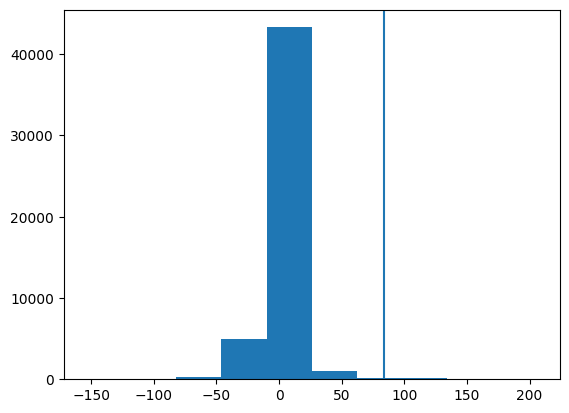

In [565]:
plt.hist((timestack[1:101, 400]-timestack[0:100, 400]).flatten())
plt.axvline(np.percentile((timestack[1:101, 400]-timestack[0:100, 400]).flatten(), 99.5))

In [597]:
np.ones((100, 2)) * np.array([1, -1]).T

array([[ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1., -1.],
       [ 1.,

(100.0, 200.0)

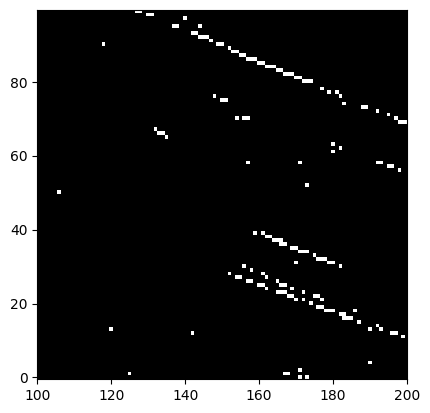

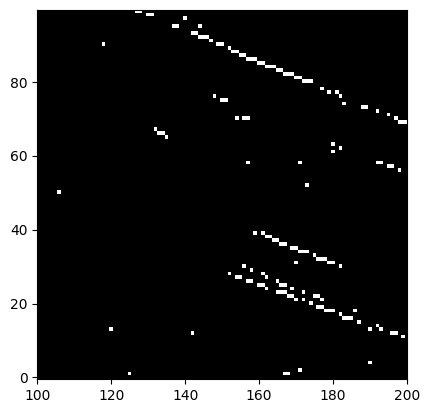

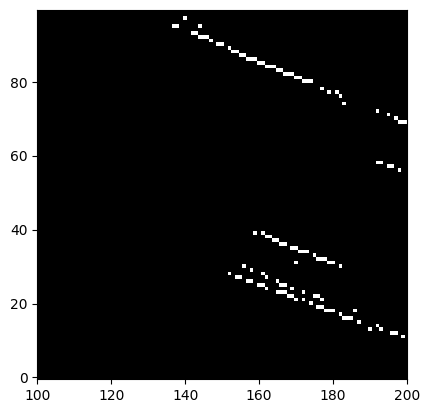

In [724]:
plt.imshow(dts > np.percentile(dts, 99.5))
plt.xlim(100, 200)
plt.figure()
plt.imshow(detect_leading_edges(dts > np.percentile(dts, 99.5), 0))
plt.xlim(100, 200)
plt.figure()
binary_image = detect_leading_edges(dts > np.percentile(dts, 99.5), 0)
plt.imshow(remove_loose_pixels_not_in_line(binary_image, min_line_length=3, eps=5, min_samples=5))
plt.xlim(100, 200)

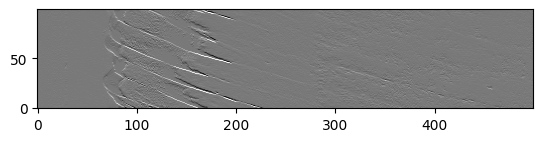

In [725]:
plt.imshow(ts[1:, 100] - ts[:-1, 100])


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

1600 500


  0%|          | 0/200 [00:00<?, ?it/s]

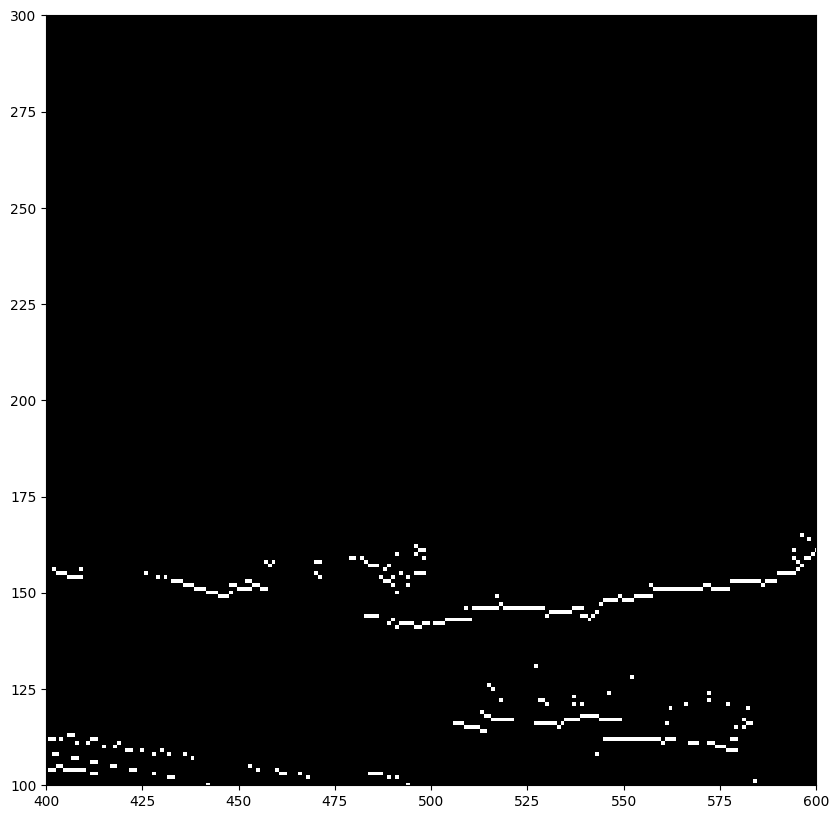

In [779]:
length = 201
ts = timestack[:length]
b = np.zeros_like(ts[:length-1, :, :])
for i in tqdm(range(1600)):
    dts = ts[1:, i]-ts[:-1, i]
    # Threshold & take rising edge
    binary_image = detect_leading_edges(dts > np.percentile(dts, 99), 0)
    b[:, i, :] = binary_image
    b[:, i, :] = remove_loose_pixels_not_in_line(binary_image, min_line_length=3, eps=5, min_samples=5)
    
    # break
    # (timestack[1:101, 400]-timestack[0:100, 400]) > np.percentile((timestack[1:101, 400]-timestack[0:100, 400]).flatten(), 99.5)
for i in tqdm(range(length-1)):
    b[i] = detect_leading_edges(b[i], 1)
    # b[i] = remove_loose_pixels_not_in_line(b[i], min_line_length=3, eps=3, min_samples=5)
    
# plt.imshow(b[:, 0, :].T)
# plt.figure()
plt.figure(figsize=(20, 10))
plt.imshow(b[1].T)
plt.xlim(400, 600)
plt.ylim(100, 300)


fname = '995percentile_breakers.mp4'
out = cv2.VideoWriter(fname, cv2.VideoWriter_fourcc(*'avc1'), FPS*5, (H,W), False)
c=1

print(H, W)
for i in tqdm(range(len(b))):
    frame = b[i].astype(np.uint8) * 255
    out.write(np.flip(np.swapaxes(frame, 0, 1), 0))
        
out.release()
cv2.destroyAllWindows()


In [780]:
fname = '995percentile_breakers_overlay_only_ts_filtering.mp4'
H, W = ts.shape[1:3]
out = cv2.VideoWriter(fname, cv2.VideoWriter_fourcc(*'avc1'), FPS*5, (H, W))

# Overlay b onto the video frames
for i in tqdm(range(len(b))):
    original_frame = ts[i].astype(np.uint8)

    # Convert the original grayscale frame to a BGR format
    original_frame_bgr = cv2.cvtColor(original_frame, cv2.COLOR_GRAY2BGR)
    
    # Set red channel where b[i] == 1
    original_frame_bgr[
        scipy.ndimage.binary_dilation(b[i] == 1)
        , 0] = 0  # Red channel (OpenCV uses BGR format)
    original_frame_bgr[
        scipy.ndimage.binary_dilation(b[i] == 1)
        , 1] = 0  # Red channel (OpenCV uses BGR format)
    original_frame_bgr[
        scipy.ndimage.binary_dilation(b[i] == 1)
        , 2] = 255  # Red channel (OpenCV uses BGR format)

    # Write the frame to the output video
    out.write(original_frame_bgr)
    # Write the frame to the output video
    out.write(np.flip(np.swapaxes(original_frame_bgr, 0, 1), 0))

out.release()
cv2.destroyAllWindows()


  0%|          | 0/200 [00:00<?, ?it/s]

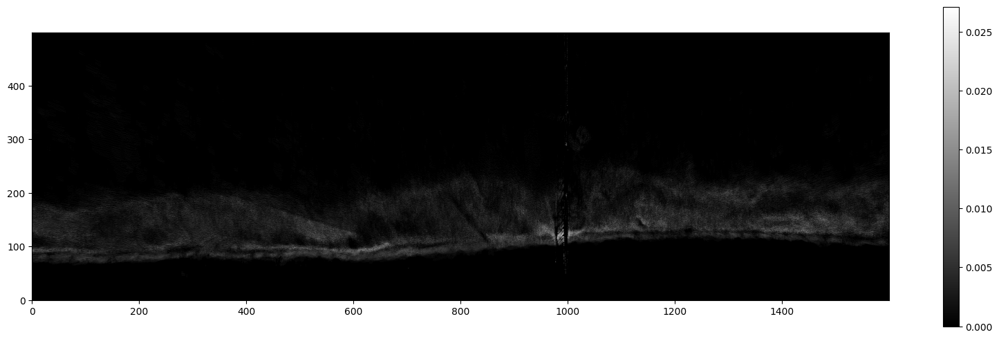

In [784]:
plt.figure(figsize=(20, 6))
plt.imshow(b.sum(0).T/len(b)/7)
plt.colorbar()

In [793]:
# Assuming b is your numpy array with shape (200, 1600, 500)

# Create x and y coordinates
filename = mission_32
start_time_str = filename.split('_')[1].replace('T', ' ').replace('Z', '')
start_time = datetime.datetime.strptime(start_time_str, '%Y%m%d %H%M%S')

# Generate time coordinate t at 0.5 Hz
t = pd.date_range(start=start_time, periods=b.shape[0], freq='0.5S')
y = np.arange(b.shape[1])  # 1600 values
x = np.arange(b.shape[2])  # 500 values

# Create a DataArray
breaking_mask = xr.DataArray(
    b,
    coords={'time': t, 'y': y, 'x': x},
    dims=['time', 'y', 'x']
)

# Convert to a Dataset
dataset = xr.Dataset({'breaking_mask': breaking_mask})

# Save the dataset to a NetCDF file
dataset.to_netcdf('mission_32_argus_breakers.nc')


/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_65874/1739697189.py:9: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  t = pd.date_range(start=start_time, periods=b.shape[0], freq='0.5S')


/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_65874/2290102812.py:7: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  t = pd.date_range(start=start_time, periods=b.shape[0], freq='0.5S')


DatetimeIndex([       '2021-10-13 17:01:00', '2021-10-13 17:01:00.500000',
                      '2021-10-13 17:01:01', '2021-10-13 17:01:01.500000',
                      '2021-10-13 17:01:02', '2021-10-13 17:01:02.500000',
                      '2021-10-13 17:01:03', '2021-10-13 17:01:03.500000',
                      '2021-10-13 17:01:04', '2021-10-13 17:01:04.500000',
               ...
                      '2021-10-13 17:02:35', '2021-10-13 17:02:35.500000',
                      '2021-10-13 17:02:36', '2021-10-13 17:02:36.500000',
                      '2021-10-13 17:02:37', '2021-10-13 17:02:37.500000',
                      '2021-10-13 17:02:38', '2021-10-13 17:02:38.500000',
                      '2021-10-13 17:02:39', '2021-10-13 17:02:39.500000'],
              dtype='datetime64[ns]', length=200, freq='500ms')

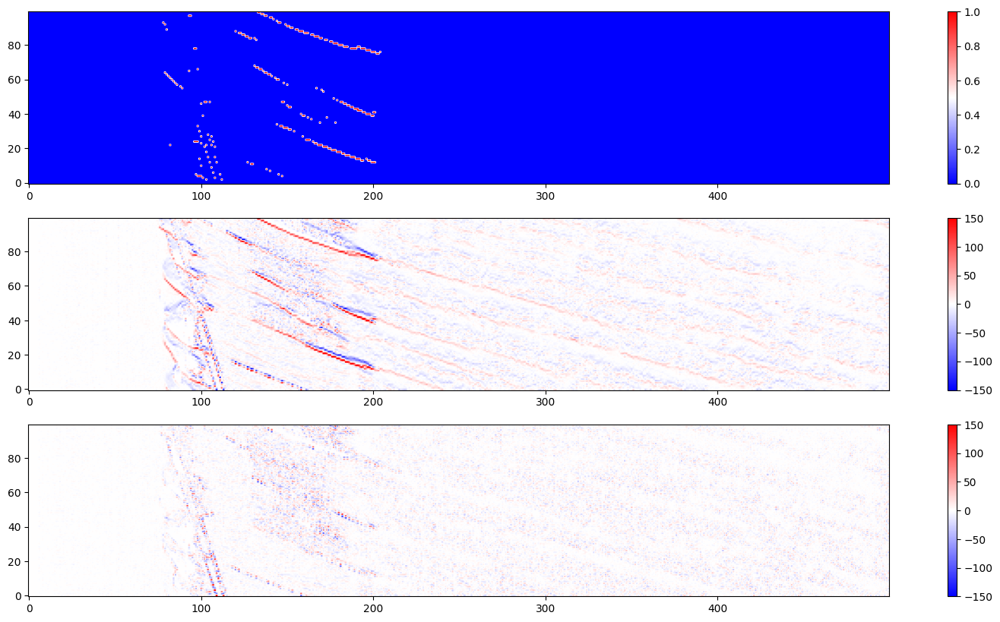

In [569]:
from PIL import Image
def normalize(x, scale=255):
    x = (x - x.min())
    return x/x.max() * scale
Image.fromarray(normalize(timestack[1:701, 400]-timestack[0:700, 400]).astype(np.uint8).T)#.save('timestack_sample.png')



fig, axs = plt.subplots(3, 1, figsize=(20, 10))
im = axs[0].imshow(timestack[1:101, 400]-timestack[0:100, 400], cmap='bwr', vmin=-150, vmax=150)
im = axs[0].imshow((timestack[1:101, 400]-timestack[0:100, 400]) > np.percentile((timestack[1:101, 400]-timestack[0:100, 400]).flatten(), 99.5), cmap='bwr')
plt.colorbar(im, ax=axs[0])
im = axs[1].imshow(timestack[1:101, 401]-timestack[0:100, 401], cmap='bwr', vmin=-150, vmax=150)
plt.colorbar(im, ax=axs[1])

im = axs[2].imshow((timestack[1:101, 400]-timestack[0:100, 400]) -
                   (timestack[1:101, 401]-timestack[0:100, 401]), cmap='bwr', vmin=-150, vmax=150)
plt.colorbar(im, ax=axs[2])




In [161]:
file = mission_32

timestack = make_timetack(dir, file)

cap = cv2.VideoCapture(os.path.join(dir, file))

N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
FPS = 2
SECONDS = N // FPS 
NFRAMES = FPS * SECONDS
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
cap.release()
cv2.destroyAllWindows()

timestack[timestack==0] = np.nan
means = np.nanmean(timestack, 0)
timestack[np.isnan(timestack)] = 0

1.92mb per timestack


Building Timestack:   0%|          | 0/1000 [00:00<?, ?it/s]

/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_65874/178105991.py:17: RuntimeWarning: Mean of empty slice
  means = np.nanmean(timestack, 0)


In [25]:
# def process_column(c, timestack_column):
#     # Create a copy of the column to make it writable
#     tt = timestack_column.copy().T
#     tt[tt == 0] = np.nan
#     extend = 20
#     mask = scipy.ndimage.binary_dilation(np.isnan(tt), structure=(np.ones((2*extend+1, 1))))
#     idx = np.where(~mask, np.arange(mask.shape[1]), 0)
#     np.maximum.accumulate(idx, axis=1, out=idx)
#     tt[mask] = tt[np.nonzero(mask)[0], idx[mask]]
#     tt[np.isnan(tt)] = 0
#     return tt.T, mask.T

# # Assuming timestack is already defined
# new_timestack = np.zeros_like(timestack)
# missing_data = np.zeros_like(timestack)

# # Parallelize the loop
# results = Parallel(n_jobs=-1)(delayed(process_column)(c, timestack[:, c, :]) for c in tqdm(range(timestack.shape[1])))

# # Unpack the results
# for c, (processed_data, mask) in enumerate(tqdm(results)):
#     new_timestack[:, c, :] = processed_data
#     missing_data[:, c, :] = mask

# plt.figure(figsize=(15, 15))
# plt.imshow(new_timestack[:, 500, :].T)
# plt.xlim([300, 600])

# timestack = new_timestack

  0%|          | 0/1600 [00:00<?, ?it/s]

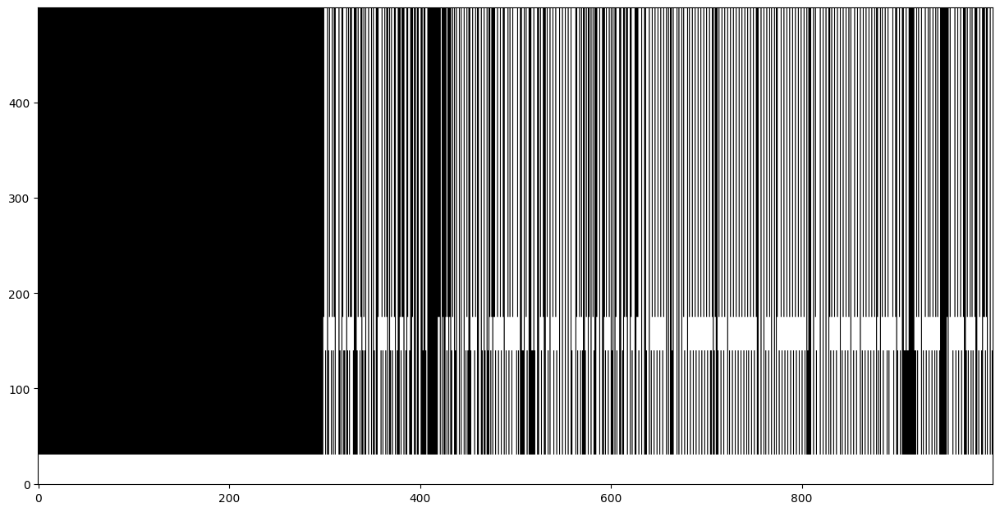

In [156]:
# Backfill data. 
# This seems to fix a lot of the problems
missing_data = np.zeros_like(timestack)
for c in tqdm(range(timestack.shape[1])):
    tt = timestack[:, c, :].T
    tt[tt==0] = np.nan
    extend = 20
    mask = scipy.ndimage.binary_dilation(np.isnan(tt), structure=(np.ones((2*extend+1, 1))))
    idx = np.where(~mask,np.arange(mask.shape[1]),0)
    np.maximum.accumulate(idx,axis=1, out=idx)
    tt[mask] = tt[np.nonzero(mask)[0], idx[mask]]
    tt[np.isnan(tt)] = 0
    missing_data[:, c, :] = mask.T
    
plt.figure(figsize=(15, 15))
plt.imshow(timestack[:, 500, :].T)
# plt.xlim([300, 600])
plt.imshow(missing_data.astype(bool)[:, 500, :].T)

In [160]:
fname = 'backfilled.mp4'
out = cv2.VideoWriter(fname, cv2.VideoWriter_fourcc(*'avc1'), FPS*5, (H,W), False)
c=1
for frame in tqdm(timestack):
    f = np.flip(np.swapaxes(frame, 0, 1), 0).astype(np.uint8)
    # print(f.dtype)
    out.write(f)
        
out.release()
cv2.destroyAllWindows()


  0%|          | 0/1000 [00:00<?, ?it/s]

In [233]:
def plot_timestack(timestack, peaks, time=(0, -1), along_shore=500):
    times = np.arange(timestack.shape[0])[time[0]: time[1]]
    plt.imshow(timestack[times, along_shore, :].T)
    
    for i in range(peaks.shape[1]):
        plt.scatter(times, peaks[along_shore, i, times], c=np.zeros_like(times) + i, s=4, cmap='jet', vmin=0, vmax=c, alpha=0.75)
    plt.colorbar()
    
def plot_peaks(timestack, peaks, time=0, c=5):
    plt.imshow(timestack[time, ...].T)
    for i in range(c-1):
        p = peaks[:, i, time]
        plt.scatter(
            np.arange(1600)[p>0], 
            p[p>0],
            # c=np.arange(c).tolist()[::-1] * 1600,
            # s=1,
            # cmap='Reds'
        )
    
def plot_all_peaks(timestack, peaks, time=0,):
    plt.imshow(timestack[time, ...].T)
    for count in range(peaks.shape[1]-1):
        for time in range(peaks.shape[2]-1):
            p = peaks[:, count, time]            
            plt.scatter(
                np.arange(1600)[p>0], 
                p[p>0],
                # c=np.arange(c).tolist()[::-1] * 1600,
                s=1,
                # cmap='Reds'
            )

In [207]:
from concurrent.futures import ProcessPoolExecutor, as_completed
from joblib import Parallel, delayed


# def process_timestack(timestack_slice, mean, c):
#     diff = timestack_slice - mean
#     sb = sobel(diff)
#     p = []
#     for j in range(sb.shape[0]):
#         pks, props = scipy.signal.find_peaks(sb[j, :], height=25)
#         peaks_sorted_by_brightness = pks[np.argsort(diff[j, :][pks])[::-1]]
#         # Threshold to only breaking
#         peaks_sorted_by_brightness = peaks_sorted_by_brightness[diff[j, :][peaks_sorted_by_brightness]>25]
        
#         if len(peaks_sorted_by_brightness) >= c:
#             p.append(peaks_sorted_by_brightness[:c])
#         else:
#             p.append(np.concatenate([peaks_sorted_by_brightness, [-1] * int(c - len(peaks_sorted_by_brightness))]))
    
#     return np.array(p).T

# def process_transect(peak_slice, time_dim, c, min_samples):
#     X = np.array(
#         [np.array([np.arange(time_dim)]*c).flatten(), 
#          peak_slice[:c, :].flatten()])

#     clustering = DBSCAN(eps=4, min_samples=min_samples).fit(X.T)
#     l = clustering.labels_
#     l = l.reshape(c, -1)
#     fp = peak_slice[:c, :]
#     fp[l<0] = -1
    
#     if len(fp) >= c:
#         return fp
#     else:
#         return np.concatenate([fp, [-1] * int(c-len(fp))])


class new_pipeline:
    
    def __init__(self, timestack):
        self.timestack = timestack

    def __call__(self):
        peaks = self.find_peaks(self.timestack)
        filtered_peaks, l = self.filter_peaks(peaks, self.timestack.shape[0], 5, 7)
        count = self.count_peaks(filtered_peaks, self.timestack.shape[1:])
        return count, filtered_peaks, peaks
    
    '''timestack is of dimension [time, cross-shore, along-shore]'''
    @staticmethod
    def find_peaks_original(timestack, c=5):
        # TODO(@mleclair): parallelize his
        '''Iterate a timestack for every cross-shore pixel, sobel filter the mean timetack, 
           and then pick out the brightest pixels where there's a peak in gradient gradient'''
        peaks = []
        
        for i in tqdm(range(0, 1600), desc='Identifying Peaks'):
            # Subtract the mean to remove bright streaks on shore & attempt to normalize for (stationary) glare
            # #TODO(@mleclair) Maybe this should actually the moving average
            # This mean thing also doesn't work well with missing data
            diff = timestack[:, i, :]-timestack[:, i, :].mean(0)
            sb = sobel(diff)
            p = []
            for j in range(0, sb.shape[0]):
                pks, props = scipy.signal.find_peaks(
                        sb[j, :], height=25,
                    )
                
                peaks_sorted_by_brightness = pks[np.argsort(diff[j, :][pks])[::-1]]
                
                if(len(pks)>=c):
                    p.append(peaks_sorted_by_brightness[:c])
                    
                else:
                    # Fill any missing peaks with -1 for consistent dimensions
                    p.append(np.concatenate([peaks_sorted_by_brightness, [-1]*int(c-len(pks))]))
                    
            peaks.append(
                    np.array(p).T
                )
        return np.array(peaks) # [cross-shore location, c, time]

    @staticmethod
    def find_peaks(timestack, missing_data, c=15):
        '''Iterate a timestack for every cross-shore pixel, sobel filter the mean timetack, 
           and then pick out the brightest pixels where there's a peak in gradient gradient'''
        
        cross_shore_transects = timestack.shape[1]
        
        timestack[timestack==0] = np.nan
        means = np.nanmean(timestack, 0)
        timestack[np.isnan(timestack)] = 0
        
        print('Calculating...')
        peaks = Parallel(n_jobs=-1)(
            delayed(process_timestack)(timestack[:, i, :], missing_data[:, i, :], means[i], c)
            for i in tqdm(range(cross_shore_transects), desc='Finding Peaks')
        )
        
        return np.array(peaks)  # [cross-shore location, c, time]

    @staticmethod
    def filter_peaks_original(peaks, time_dim, c=5, min_samples=None):
        '''For each cross-shore transect DBSCAN to identify coherent waves'''
        if min_samples is None:
            min_samples = int(1.5*c)
        
        cross_shore_transects = peaks.shape[0]
        
        filtered_peaks = Parallel(n_jobs=-1)(
            delayed(process_transect)(peaks[i], time_dim, c, min_samples)
            for i in tqdm(range(cross_shore_transects), desc='Filtering Peaks')
        )
        
        return np.array(filtered_peaks)


    @staticmethod
    def filter_peaks(peaks, time_dim, c=5, min_samples=None, eps=2):
        # TODO(@mleclair): parallelize his
        '''For each cross-shore transect DBSCAN to identify coherent waves'''
        if min_samples is None:
            min_samples = int(1.5*c)
        labels = []
        filtered_peaks = []
        cross_shore_transects = peaks.shape[0]
        for i in tqdm(range(cross_shore_transects), desc='Filtering Peaks'):
            X = np.array(
                [np.array([np.arange(time_dim)]*c).flatten(), 
                 peaks[i][:c, :].flatten()])

            clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(X.T)
            l = clustering.labels_
            l = l.reshape(c, -1)
            fp = peaks[i][:c, :]
            fp[l<0] = -1
            if len(fp>=c):
                filtered_peaks.append(fp)
            else:
                filtered_peaks.append(np.concatenate([fp, [-1] * int(c-len(fp))]))

        
        return np.array(filtered_peaks) # [cross-shore transects, peaks, time], labels
    
    @staticmethod
    def count_breakers(peaks, c=5):
        filtered_peaks = []
        for i in tqdm(range(len(peaks))): # Iterating over alongshore locations
            X = np.array([np.array([np.arange(peaks.shape[-1])]*c).flatten(), peaks[i][:c, :].flatten()])
            filtered_peaks.append(X)

        return filtered_peaks
    
    @staticmethod
    def count_peaks(filtered, image_shape):
        count = np.zeros(image_shape)
        for i in range(filtered.shape[0]):
            for j in range(filtered.shape[2]):
                idx = filtered[i, :, j][filtered[i, :, j]>=0]
                count[i, idx] += 1
        return count


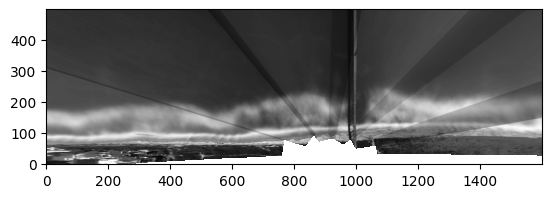

<Figure size 640x480 with 0 Axes>

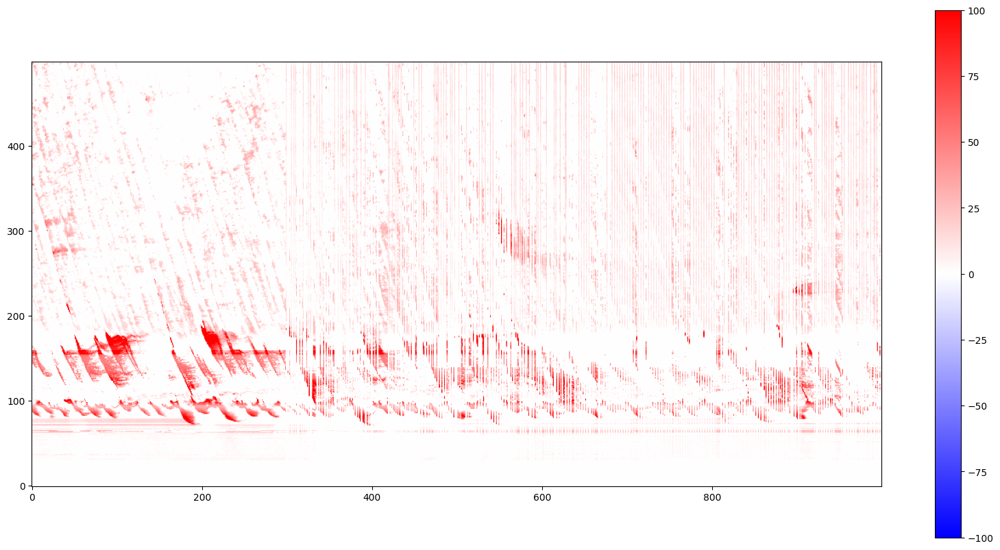

In [9]:
plt.imshow(means.T)
plt.figure()
plt.figure(figsize=(20, 10))
m = (timestack[:, 500, :] - means[500, :]).T
m[m<=0] = 0
m[missing_data.astype(bool)[:, 500, :].T] = 0
plt.imshow(m, vmin=-100, vmax=100, cmap='bwr')
# plt.xlim(400, 600)
plt.colorbar()

In [65]:
i = 500
timestack_slice, md, mean = timestack[:, i, :], missing_data[:, i, :], means[i],
diff = timestack_slice - mean
rising_edge(diff[0, :], 40)

(array([ 88, 123, 146, 152, 163, 359]),)

nan


Text(0.5, 1.0, 'min=3, eps=5')

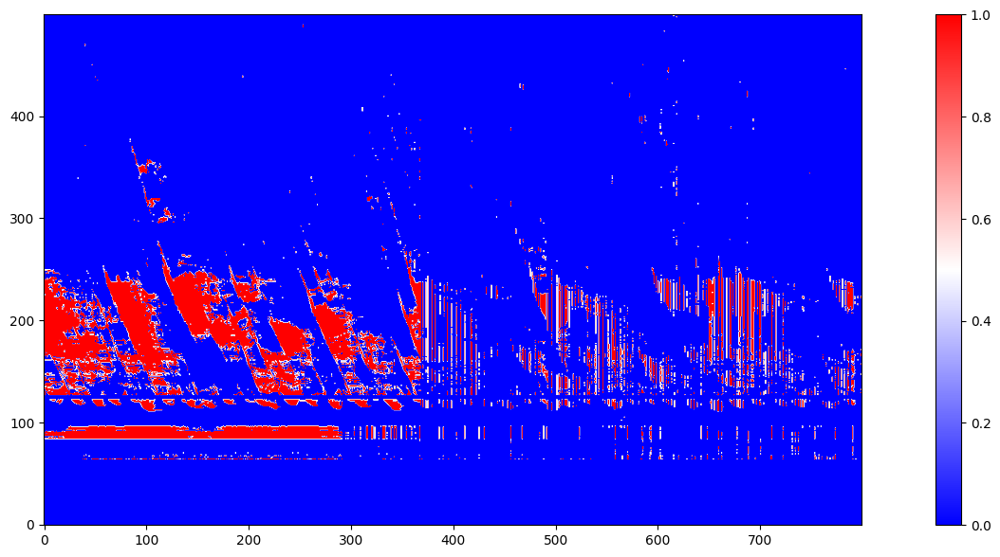

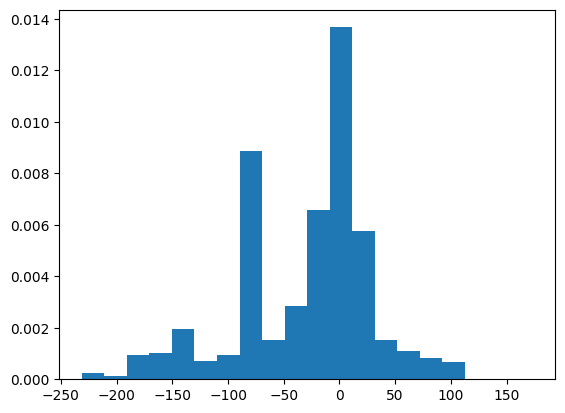

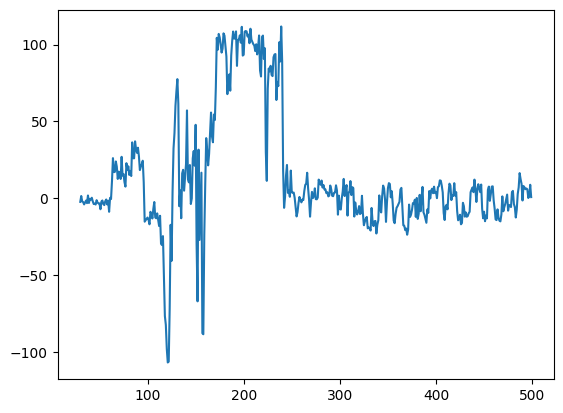

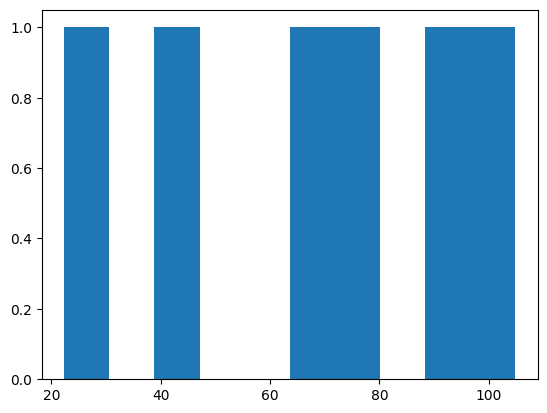

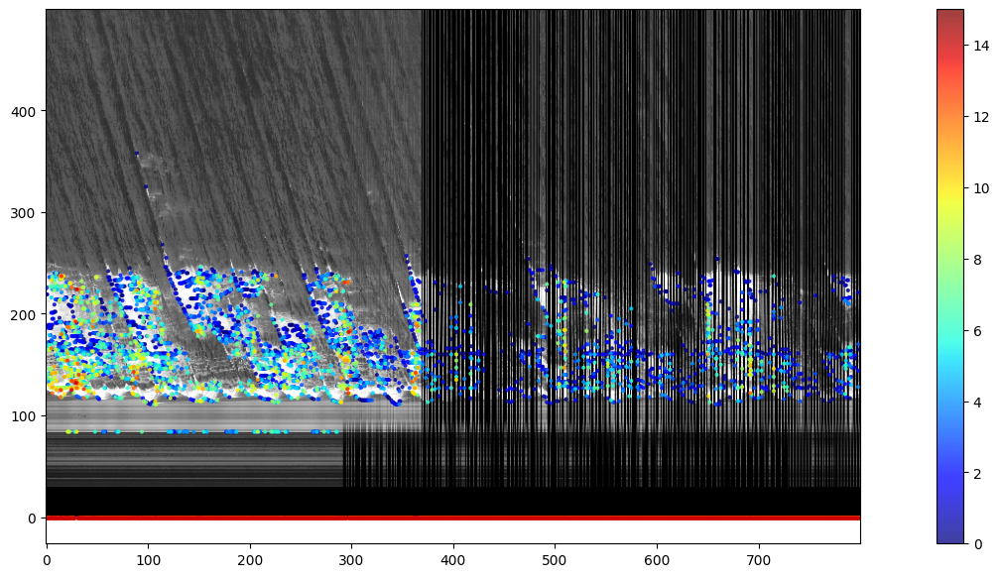

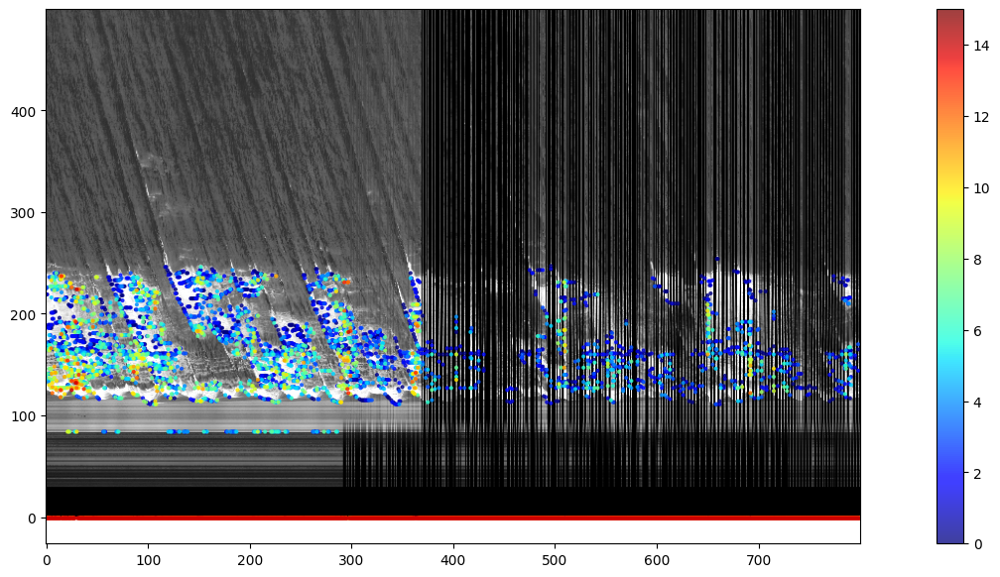

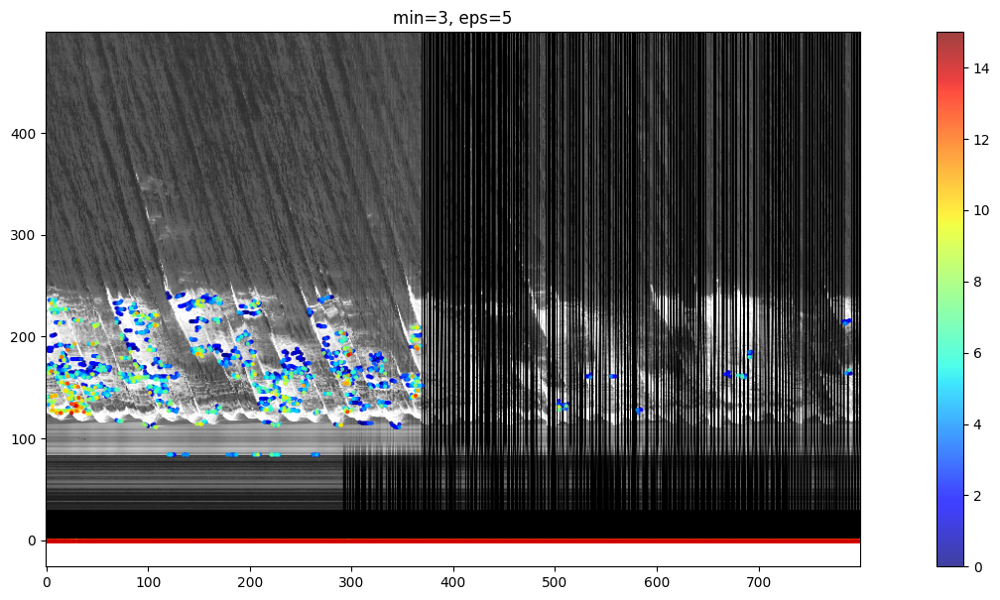

In [512]:
c = 15
peaks = np.zeros((1600, c, timestack.shape[0]))
filtered_peaks = np.zeros((1600, c, timestack.shape[0]))

i = 1100

def process_timestack(timestack_slice, missing_data_slice, mean, c, plot=False):
    diff = timestack_slice - mean
    sb = sobel(diff)
    p = []
    if plot:
        plt.figure(figsize=(20, 7))
        # plt.imshow(np.isnan(diff))
        plt.imshow(((diff > 30) & ~missing_data_slice.astype(bool)).T, cmap='bwr')
        plt.colorbar()
        plt.figure()
        plt.hist(diff.flatten(), bins=20, density=True)
        print(np.percentile(diff, 90))
    time_dim = sb.shape[0]
    diff_threshold = np.percentile(diff[~np.isnan(diff)], 92)
    timestack_threshold = np.percentile(timestack_slice[~np.isnan(timestack_slice)], 90)
    sobel_threshold = np.percentile(sb[~np.isnan(sb)], 95)
    # dt_threshold = np.percentile(dt[~np.isnan(dt)], 90)
    for j in range(time_dim):
        pks, props = scipy.signal.find_peaks(sb[j, :], height=80)
        peaks_sorted_by_brightness = pks[np.argsort(diff[j, :][pks])[::-1]]
        
        # Threshold to only breaking
        peaks_sorted_by_brightness = peaks_sorted_by_brightness[diff[j, :][peaks_sorted_by_brightness]>= np.percentile(diff[j, :][~np.isnan(diff[j, :])], 75)]
        peaks_sorted_by_brightness = peaks_sorted_by_brightness[missing_data_slice[j, :][peaks_sorted_by_brightness]==0]
        peaks_sorted_by_brightness = peaks_sorted_by_brightness[timestack_slice[j, :][peaks_sorted_by_brightness]>=timestack_threshold]
        peaks_sorted_by_brightness = peaks_sorted_by_brightness[sb[j, :][peaks_sorted_by_brightness]>=sobel_threshold]
        if j == 0 and plot:
            plt.figure()
            plt.plot(diff[j, :])
            plt.figure()
            plt.hist(diff[j, peaks_sorted_by_brightness])
        
        if len(peaks_sorted_by_brightness) >= c:
            p.append(peaks_sorted_by_brightness[:c])
        else:
            p.append(np.concatenate([peaks_sorted_by_brightness, [-1] * int(c - len(peaks_sorted_by_brightness))]))
    
    return np.array(p).T

def rising_edge(data, thresh):
    # original code: translated to below by chatgpt for ~30% speedup
    # sign = data >= thresh
    # pos = np.where(np.convolve(sign, [1, -1]) == 1)[0]

    sign = data >= thresh
    pos = np.where((~sign[:-1]) & sign[1:])[0] + 1
    return pos


# def process_timestack(timestack_slice, missing_data_slice, mean, c, plot=False):
#     diff = timestack_slice - mean
#     # print(diff.shape)
#     # To do 
#     sb = sobel(diff)
#     p = []
#     if plot:
#         plt.figure(figsize=(20, 7))
#         # plt.imshow(np.isnan(diff))
#         # plt.imshow(((diff > 30) & ~missing_data_slice.astype(bool)).T, cmap='bwr')
#         plt.imshow(diff.T * (-missing_data_slice.T + 1), 
#                    vmin=np.percentile(diff[~np.isnan(diff)], 90),
#                    vmax=np.percentile(diff[~np.isnan(diff)], 99),
#                    cmap='hot')
#         plt.title('diff')
#         plt.figure(figsize=(20, 7))
#         plt.imshow(sb.T * (-missing_data_slice.T + 1), 
#                     vmin=np.percentile(sb[~np.isnan(sb)], 99),
#                     # vmax=np.percentile(sb[~np.isnan(sb)], 99),
#                 #    vmax=np.percentile(diff[~np.isnan(diff)], 99),
#                    cmap='hot')
#         plt.title('sb')
#         plt.figure(figsize=(20, 7))
#         dt = np.gradient(diff)[0].T * (-missing_data_slice.T + 1)
#         plt.imshow(
#             dt > np.percentile(dt[~np.isnan(dt)], 95),
#             cmap='bwr', vmin=-1, vmax=1
#                    )
#         plt.title('dt')
#         plt.colorbar()
#         plt.figure(figsize=(20, 7))
#         plt.imshow(np.gradient(diff)[1].T * (-missing_data_slice.T + 1), cmap='hot',
#                    vmin=25)
#         plt.title('dx')
#         plt.colorbar()
#         plt.figure()
#         plt.hist(diff.flatten(), bins=20, density=True)
#         plt.figure()
#         plt.hist(timestack_slice.flatten(), bins=20, density=True)
#         plt.figure()
#         plt.hist(np.gradient(diff)[0].flatten(), bins=20, density=True)
#         plt.figure()
        
#         plt.hist(np.gradient(diff)[1].flatten(), bins=20, density=True)
#         plt.figure()
        
#         plt.hist(sb.flatten(), bins=20, density=True)
        
#         print([(x, np.percentile(sb[~np.isnan(sb)], x)) for x in [75, 80, 85, 90, 95, 99]])
#         # print(np.percentile(diff[~np.isnan(sb)], 95))
#         # print(np.percentile(diff[~np.isnan(sb)], 99))
#     time_dim = sb.shape[0]
#     diff_threshold = np.percentile(diff[~np.isnan(diff)], 92)
#     timestack_threshold = np.percentile(timestack_slice[~np.isnan(timestack_slice)], 90)
#     sobel_threshold = np.percentile(sb[~np.isnan(sb)], 95)
#     dt_threshold = np.percentile(dt[~np.isnan(dt)], 90)
#     for j in range(time_dim):
#         pks = rising_edge(
#             diff[j, :] >= diff_threshold, 1)
    
#         # peaks_sorted_by_brightness = pks
#         # pks, props = scipy.signal.find_peaks(sb[j, :], height=80)
#         peaks_sorted_by_brightness = pks[np.argsort(diff[j, :][pks])[::-1]]
#         peaks_sorted_by_brightness = np.array(peaks_sorted_by_brightness)
#         # # Threshold to only breaking
#         # peaks_sorted_by_brightness = peaks_sorted_by_brightness[diff[j, :][peaks_sorted_by_brightness]>= np.percentile(diff[j, :][~np.isnan(diff[j, :])], 75)]
#         peaks_sorted_by_brightness = peaks_sorted_by_brightness[missing_data_slice[j, :][peaks_sorted_by_brightness]==0]
#         peaks_sorted_by_brightness = peaks_sorted_by_brightness[timestack_slice[j, :][peaks_sorted_by_brightness]>=timestack_threshold]
#         peaks_sorted_by_brightness = peaks_sorted_by_brightness[sb[j, :][peaks_sorted_by_brightness]>=sobel_threshold]
#         # if j < len(dt):
#         #     peaks_sorted_by_brightness = peaks_sorted_by_brightness[dt[j, :][peaks_sorted_by_brightness-1]>=dt_threshold]

#         if j == 0 and plot:
#             plt.figure()
#             plt.plot(diff[j, :])
#             plt.axhline(diff_threshold)
#             for pp in pks:
#                 # print(pp)
#                 plt.axvline(pp, c='r')
#             # plt.figure()
#             # plt.hist(diff[j, peaks_sorted_by_brightness])
#             # plt.title()
        
#         if len(peaks_sorted_by_brightness) >= c:
#             p.append(peaks_sorted_by_brightness[:c])
#         else:
#             p.append(np.concatenate([peaks_sorted_by_brightness, [-1] * int(c - len(peaks_sorted_by_brightness))]))
#     return np.array(p).T

# def process_transect(peak_slice, time_dim, c, eps, min_samples):
#     X = np.array(
#         [np.array([np.arange(time_dim)]*c).flatten(), 
#          peak_slice[:c, :].flatten()])

#     clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(X.T)

#     # clustering.labels_
#     # # clustering = DBSCAN(eps=3, min_samples=5).fit(X[l>0].T)
#     l = clustering.labels_
#     l = l.reshape(c, -1)
#     fp = peak_slice[:c, :]
#     fp[l<0] = -1
    
#     if len(fp) >= c:
#         return fp
#     else:
#         return np.concatenate([fp, [-1] * int(c-len(fp))])

peaks[i] = process_timestack(timestack[:, i, :], missing_data[:, i, :], means[i], c, True)

plt.figure(figsize=(20, 7))
plot_timestack(timestack, peaks, (0, 999), i)

plt.figure(figsize=(20, 7))
filtered_peaks[i] = process_transect(peaks[i], timestack.shape[0], c, eps=5, min_samples=2)
plot_timestack(timestack, filtered_peaks[:, :, :], (0, 999), i)
# plt.title('min=10, eps=2')
plt.figure(figsize=(20, 7))
filtered_peaks[i] = process_transect(filtered_peaks[i], timestack.shape[0], c, 3, 5)
plot_timestack(timestack, filtered_peaks, (0, 999), i)
plt.title('min=3, eps=5')

# plt.figure(figsize=(15, 2))
# plot_timestack(timestack, filtered_peaks[:, :, :], (0, 999), i)
# plt.xlim(0, 400)
# plt.ylim(50, 100)

# plt.figure(figsize=(15, 4))
# plot_timestack(timestack, filtered_peaks[:, :, :], (0, 999), i)
# plt.xlim(200, 600)
# plt.ylim(200, 400)


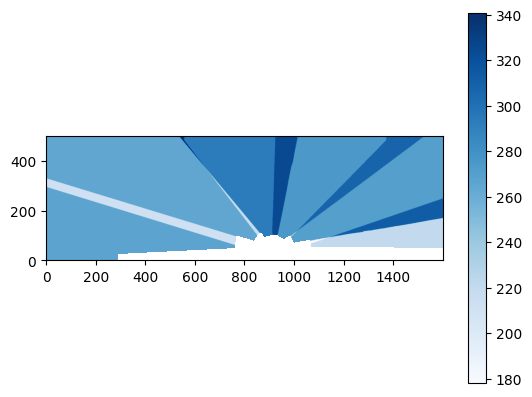

In [129]:
seconds_of_footage = (missing_data != 1).sum(0)/FPS
seconds_of_footage[seconds_of_footage==0] = np.nan
plt.imshow(seconds_of_footage.T, cmap='Blues')
plt.colorbar()

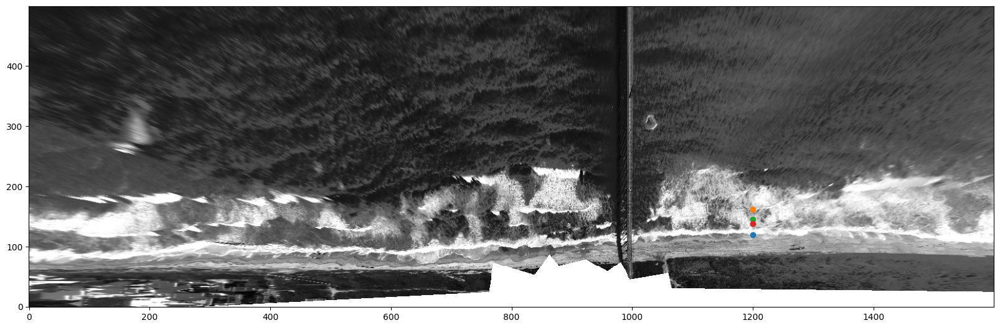

In [93]:
plt.figure(figsize=(20, 7))
plot_peaks(timestack, peaks, time)

/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_65874/3644064381.py:14: RuntimeWarning: invalid value encountered in cast
  plt.imshow(np.swapaxes(draw_peaks(timestack[0].astype(np.uint8), peaks[:, :5, 0]), 0, 1))


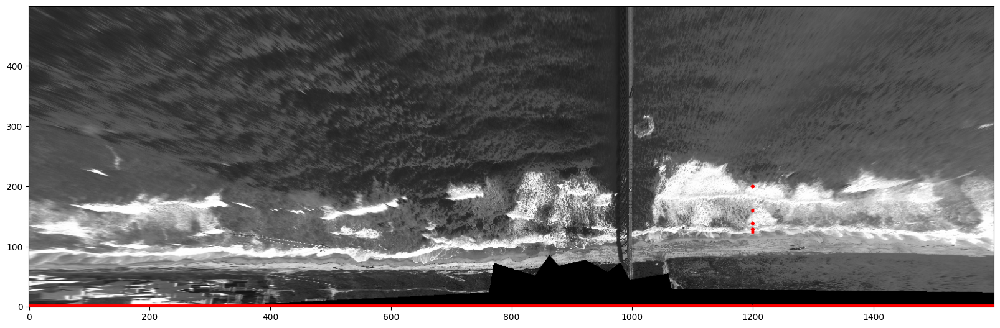

In [94]:
def draw_peaks(image, peaks):
    image = cv2.merge((image, image, image))
 
    for i in range(peaks.shape[1]):
        for x, y, in zip(peaks[:, i].astype(int), np.arange(peaks.shape[0])):
            if x == -1:
                continue
            # image = cv2.circle(image, (x, y), int((peaks.shape[1] - c + 1)//2), (255, 0, c * 25), -1)
            image = cv2.circle(image, (x, y), 3, (255, 0, 0), -1)

    return image.astype(np.uint8)

plt.figure(figsize=(20, 7))
plt.imshow(np.swapaxes(draw_peaks(timestack[0].astype(np.uint8), peaks[:, :5, 0]), 0, 1))

In [447]:
fname = 'filtered_peaks.mp4'
out = cv2.VideoWriter(fname, cv2.VideoWriter_fourcc(*'avc1'), FPS*5, (H,W))
c=1
for i, (frame, peak) in enumerate(tqdm(zip(timestack, filtered[:, :, :].T))):
    peaks_at_time = peak
    print(np.array(np.arange(1600).tolist() * peaks_at_time.shape[1]).shape)
    print(peaks_at_time.flatten().shape)
    X = np.array([
        np.array(np.arange(1600).tolist() * peaks_at_time.shape[1]).flatten()/5, 
        peaks_at_time.flatten()
    ])

    clustering = DBSCAN(eps=4, min_samples=10).fit(X.T)
    l = clustering.labels_
    l = l.reshape(peaks_at_time.shape)
    print(l.shape)
    print(peaks_at_time.shape)
    fp = peaks_at_time.copy()
    fp[l<=0] = -1

    f = np.flip(np.swapaxes(draw_peaks(frame, fp.T), 0, 1), 0)
    out.write(f)
        
out.release()
cv2.destroyAllWindows()


0it [00:00, ?it/s]

(2560000,)
(24000,)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2,) + inhomogeneous part.

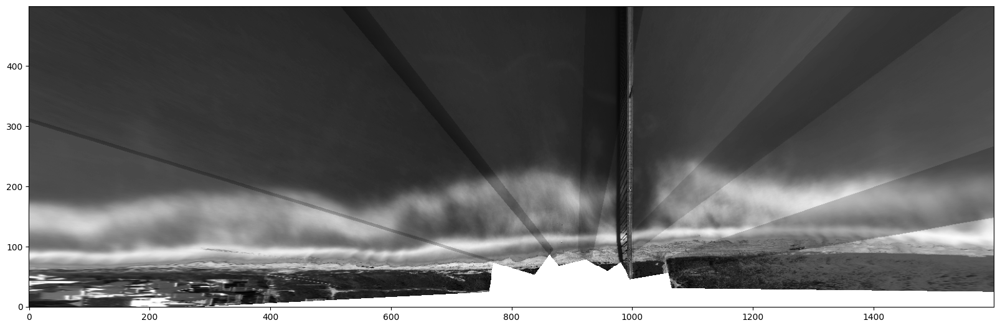

In [180]:
plt.figure(figsize=(20,20))
plt.imshow(means.T)

Text(0.5, 1.0, 'Image - Mean')

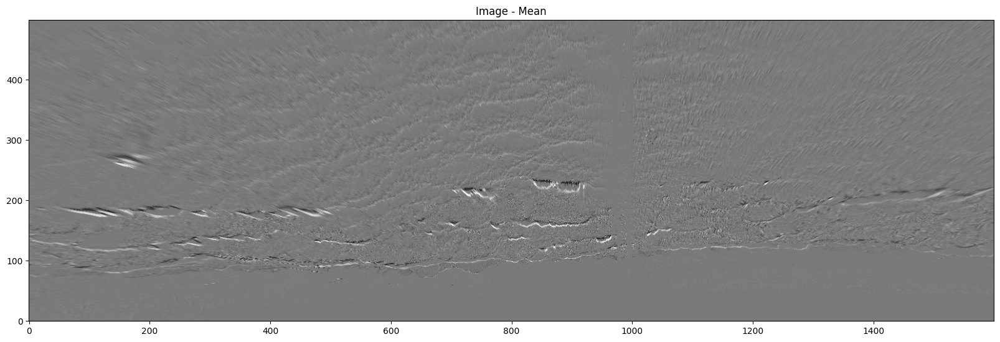

In [139]:
plt.figure(figsize=(20,20))
plt.imshow((timestack[time, ...]).T  - (timestack[time-1, ...]).T)
plt.title('Image - Mean')

/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_65874/3201856636.py:92: RuntimeWarning: Mean of empty slice
  means = np.nanmean(timestack, 0)


Calculating...


Finding Peaks:   0%|          | 0/1600 [00:00<?, ?it/s]

(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)
(800, 500)

Text(0.5, 1.0, 'All Peaks')

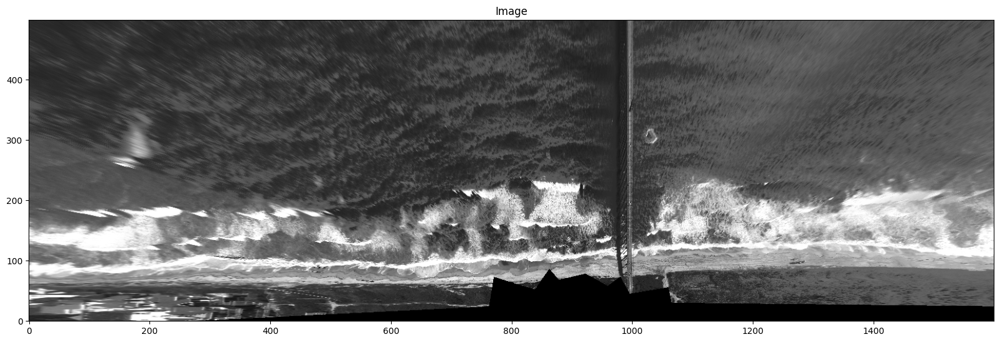

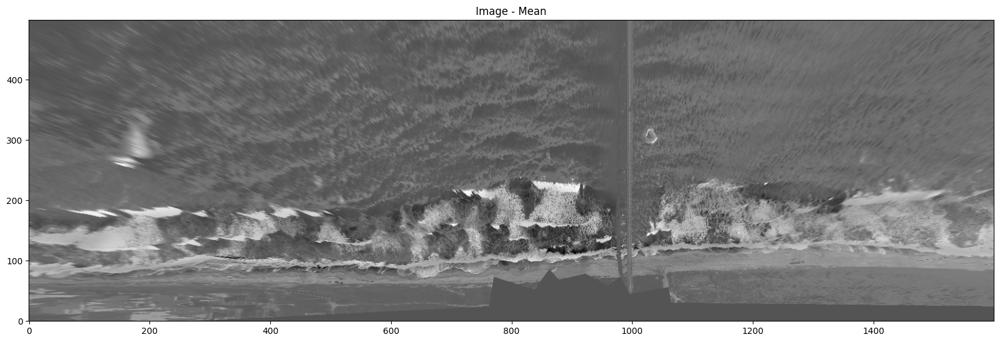

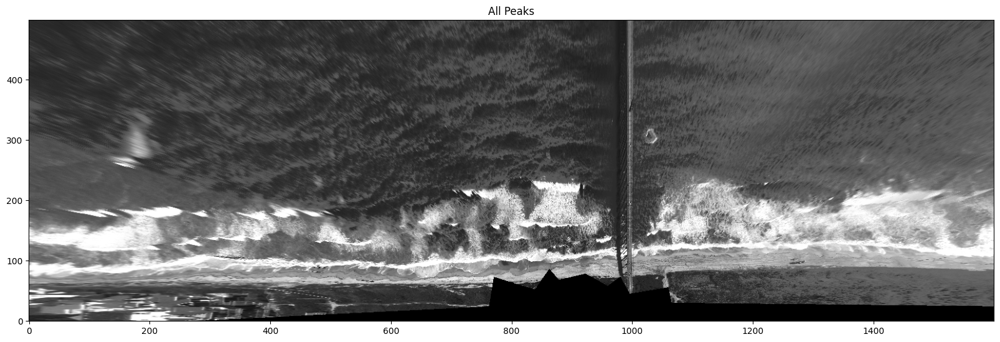

In [281]:
time = 50
# timestack = make_timetack(dir, mission_32)
# timestack[timestack==0] = np.nan
# means = np.nanmean(timestack, 0)
# timestack[np.isnan(timestack)] = 0
timestack = timestack[:800, ...]
missing_data = missing_data[:800, ...]
plt.figure(figsize=(20,20))
plt.imshow((timestack[time, ...]).T)
plt.title('Image')
plt.figure(figsize=(20,20))
plt.imshow((timestack[time, ...] - timestack.mean(0)).T)
plt.title('Image - Mean')
plt.figure(figsize=(20,20))
peaks = new_pipeline.find_peaks(timestack, missing_data, c)
plot_peaks(timestack, peaks, time, c)
plt.title('All Peaks')

Filtering Peaks:   0%|          | 0/1600 [00:00<?, ?it/s]

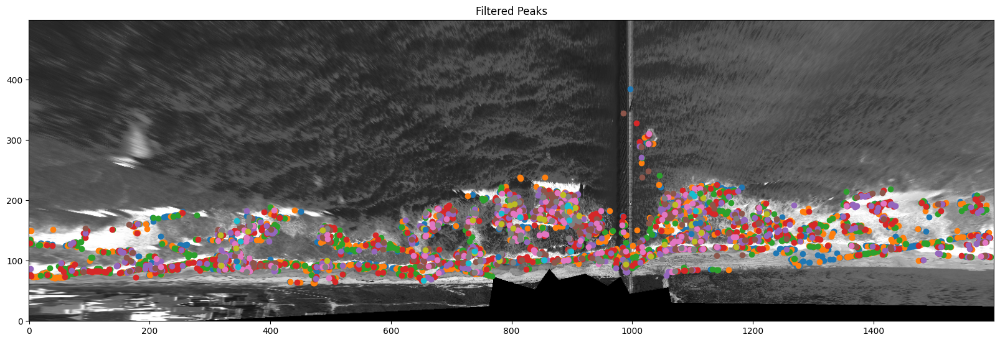

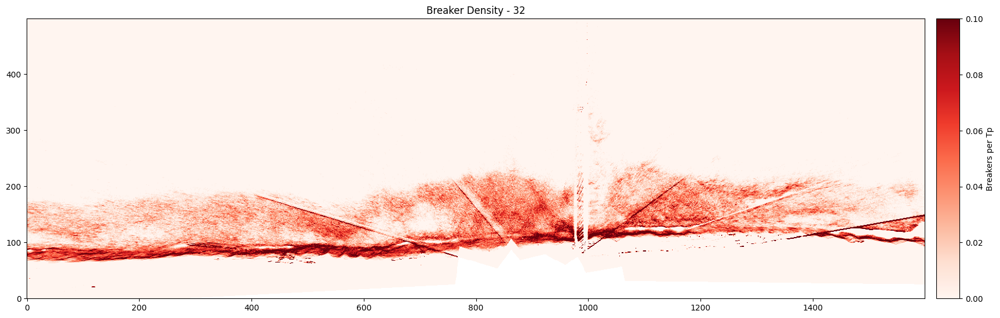

In [272]:
plt.figure(figsize=(20,20))
plt.title('Filtered Peaks')
filtered = new_pipeline.filter_peaks(peaks, timestack.shape[0], c, min_samples=2, eps=2)
plot_peaks(timestack, filtered, time, c)
fig, ax = plt.subplots(1,1, figsize=(20,20))
count = new_pipeline.count_peaks(filtered[:, :5, :], timestack.shape[1:])
seconds_of_footage = (timestack !=0).sum(0)/FPS
seconds_of_footage[seconds_of_footage==0] = np.nan
im = plt.imshow((count/seconds_of_footage).T, vmax=0.1, cmap='Reds')
plt.title('Breaker Density - 32')
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax, label='Breakers per Tp')

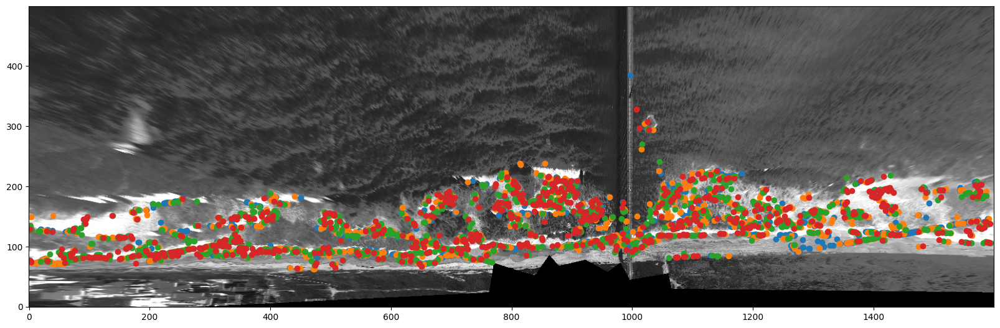

In [277]:
plt.figure(figsize=(20, 20))
plot_peaks(timestack, filtered, 50, 5)

(15, 1600)
(1600, 15)


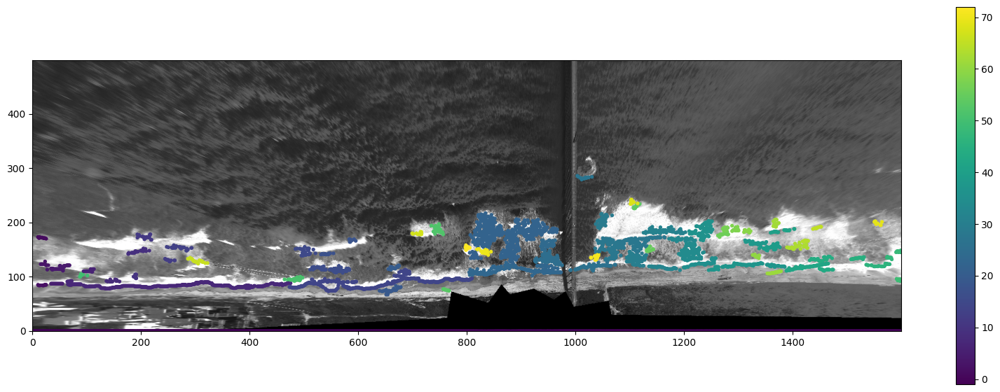

In [499]:
peaks_at_time = filtered[..., 4]
X = np.array(
    [np.array(np.arange(1600).tolist() * peaks_at_time.shape[1]).flatten()/2, 
     peaks_at_time.T.flatten()])

clustering = DBSCAN(eps=5, min_samples=10).fit(X.T)
l = clustering.labels_
l = l.reshape(peaks_at_time.T.shape)
print(l.shape)
print(peaks_at_time.shape)
fp = peaks_at_time.T.copy()
fp[l<0] = -1

# fp = fp.reshape(peaks_at_time.shape)
plt.figure(figsize=(20,7))
plt.scatter(
    np.array(np.arange(1600).tolist() * filtered.shape[1]),
    fp,
    c=l,
    # c='r',
    s=8,
    cmap='viridis'
)
plt.colorbar()
plt.imshow(timestack[2].T)


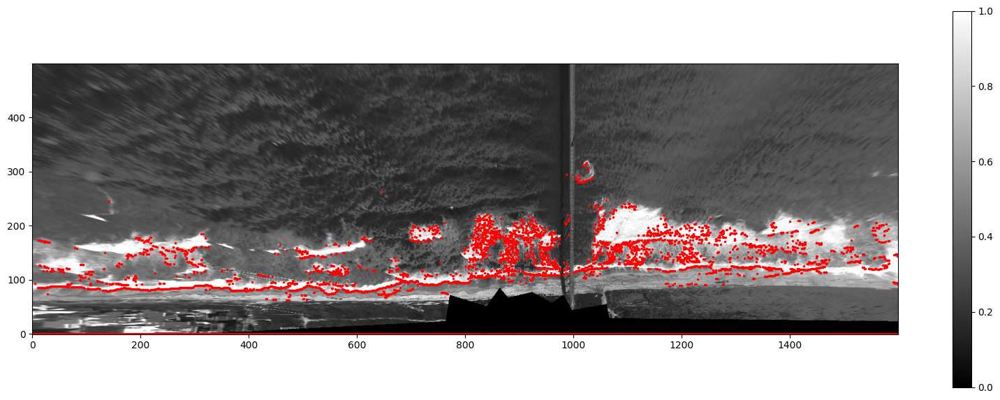

In [504]:
peaks_at_time = filtered[..., 3]
plt.figure(figsize=(20, 7))
plt.scatter(
    np.array(np.arange(1600).tolist() * peaks_at_time.shape[1]).flatten(), 
    peaks_at_time.T.flatten(),
    c='r',
    s=2
)
plt.colorbar()
plt.imshow(timestack[2].T)
